In [28]:
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import  StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("kc_house_data.csv")

In [3]:
df.isnull().sum()


id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.head()


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [5]:
df.shape

(21613, 21)

In [6]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [7]:
df.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [8]:
df.drop("id",axis=1,inplace=True)

In [9]:
df.isna().sum()


date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

## EDA

In [10]:
#  scatter plot
fig = px.scatter(df, x='sqft_living', y='price', title='House Price Prediction',
                 labels={'sqft_living': 'Square Footage', 'price': 'Price'})

fig.show()

In [11]:
#box plot
fig = px.box(df, x='bedrooms', y='price', title='House Price Distribution by Bedrooms',
             labels={'bedrooms': 'Bedrooms', 'price': 'Price'},boxmode='overlay',color='bedrooms')
fig.update_xaxes(range=[0, 11])


fig.show()

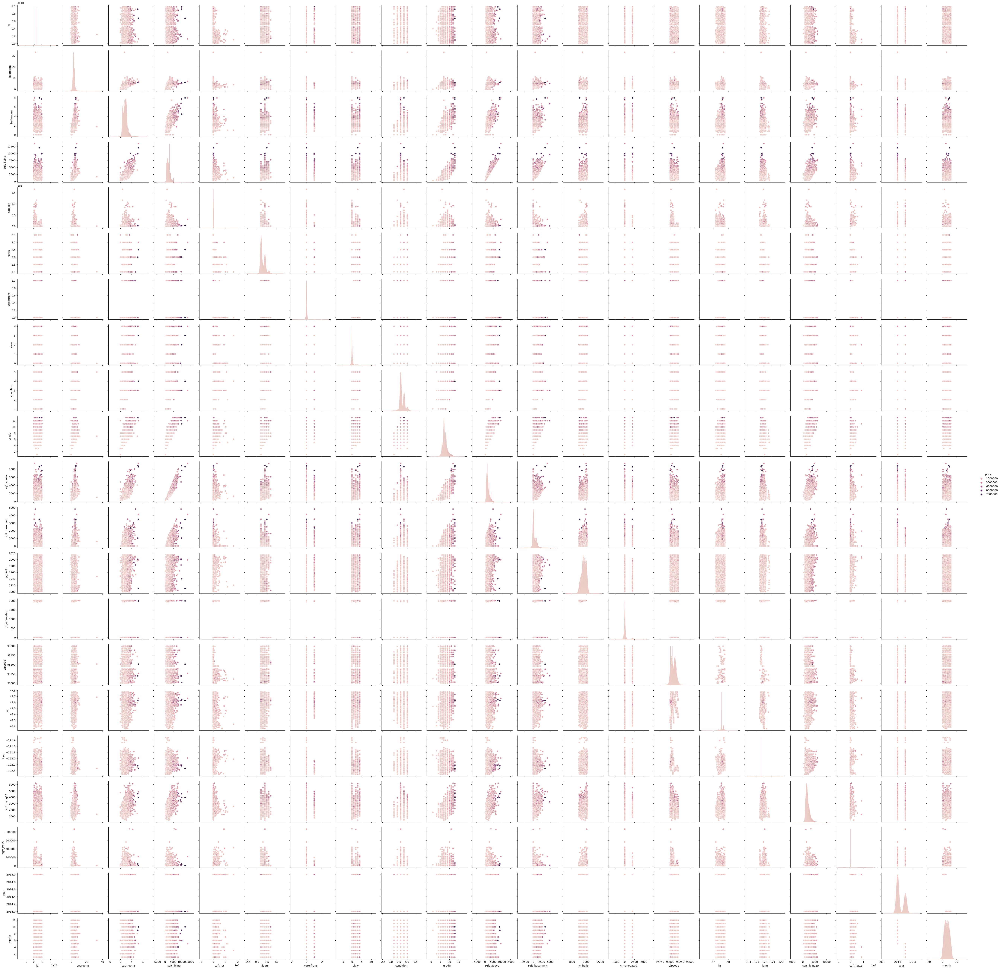

In [12]:
sns.pairplot(data = df , hue = 'price')


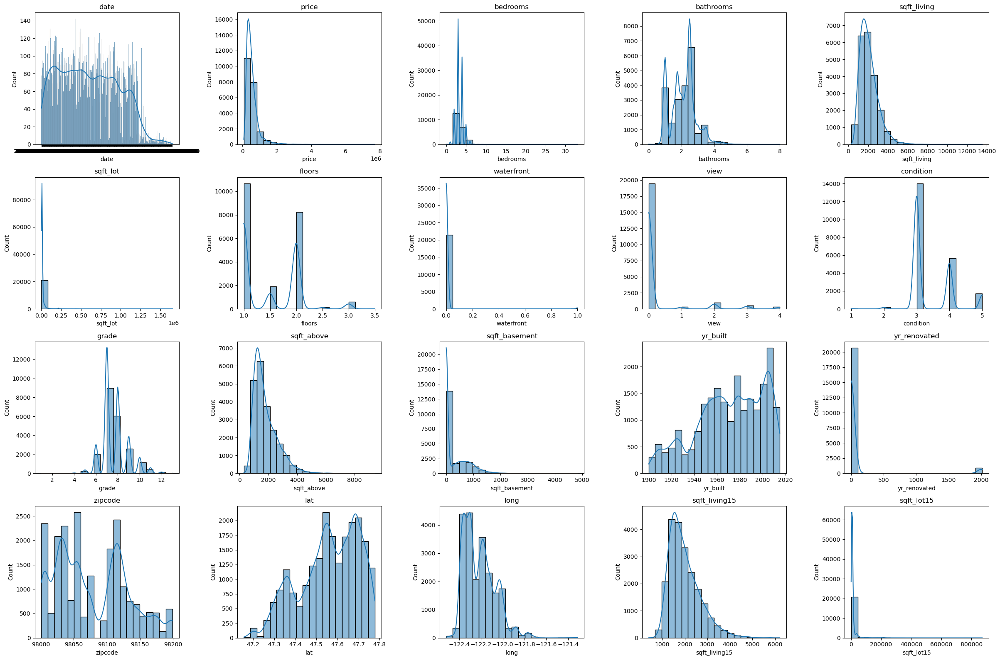

In [12]:
plt.figure(figsize=(24, 16))
for feature in df.columns.to_list():
    plt.subplot(4, 5, df.columns.to_list().index(feature) + 1)
    sns.histplot(data=df[feature], bins=20, kde=True)
    plt.title(feature)
plt.tight_layout()
plt.show()

In [13]:
df["waterfront"].value_counts().reset_index()


,index,waterfront
0,0,21450
1,1,163


In [14]:
df["view"].value_counts().reset_index()


,index,view
0,0,19489
1,2,963
2,3,510
3,1,332
4,4,319


In [15]:
df["yr_renovated"].value_counts().reset_index()


,index,yr_renovated
0,0,20699
1,2014,91
2,2013,37
3,2003,36
4,2005,35
...,...,...
65,1951,1
66,1959,1
67,1948,1
68,1954,1


In [ ]:
#Most Values of these Columns (yr_renovated,view,waterfront) is zero ,so we gonna drop them

In [16]:
df.drop(["waterfront","view","zipcode","yr_renovated"],axis =1 ,inplace = True)

In [17]:
df.drop(["sqft_lot15","sqft_living15","sqft_above"],axis=1, inplace = True)

In [18]:
datetime_column = df['date']  # Save the datetime column separately


numeric_columns = df.drop(["grade","condition","floors","bathrooms","bedrooms"],axis=1).select_dtypes(include=['float64', 'int64']).columns
numeric_data = df[numeric_columns]

In [20]:
scaler = StandardScaler()
scaled_numeric_data = scaler.fit_transform(numeric_data)

scaled_df = pd.DataFrame(scaled_numeric_data, columns=numeric_columns)

In [22]:
#transform data with power transform (method = yeo-johnson ) to make distribution of data normalized
numeric_data = scaled_df[numeric_columns]


transformer = PowerTransformer(method = "yeo-johnson")
transformed_numeric_data = transformer.fit_transform(numeric_data)

In [23]:
# Combine scaled numeric data with the datetime column
transformed_df = pd.DataFrame(transformed_numeric_data, columns=numeric_columns)
transformed_df['date'] = datetime_column 
transformed_df[['grade','condition','floors','bathrooms','bedrooms']] = df[['grade','condition','floors','bathrooms','bedrooms']]

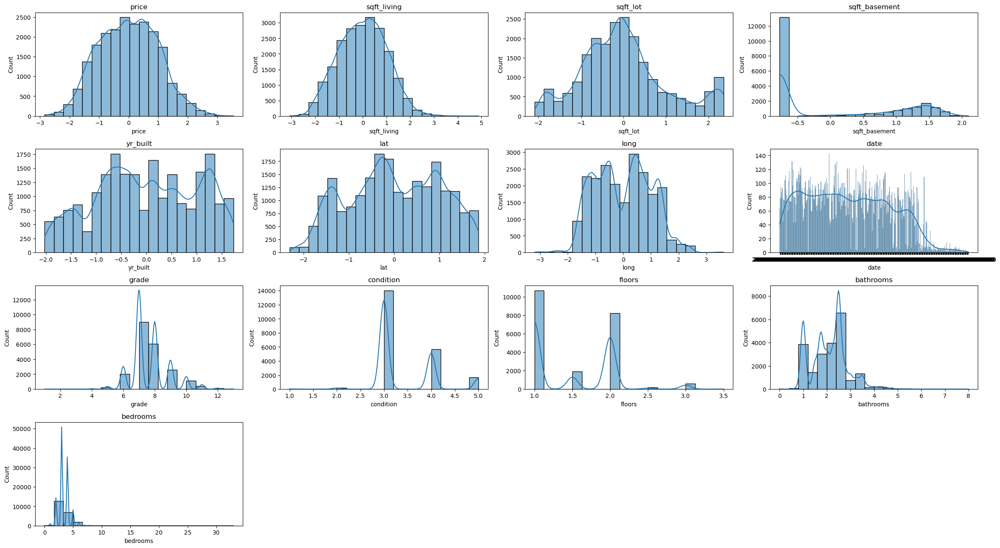

In [24]:
plt.figure(figsize=(24, 16))
for feature in transformed_df.columns.to_list():
    plt.subplot(5, 4, transformed_df.columns.to_list().index(feature) + 1)
    sns.histplot(data=transformed_df[feature], bins=20, kde=True)
    plt.title(feature)
plt.tight_layout()
plt.show()

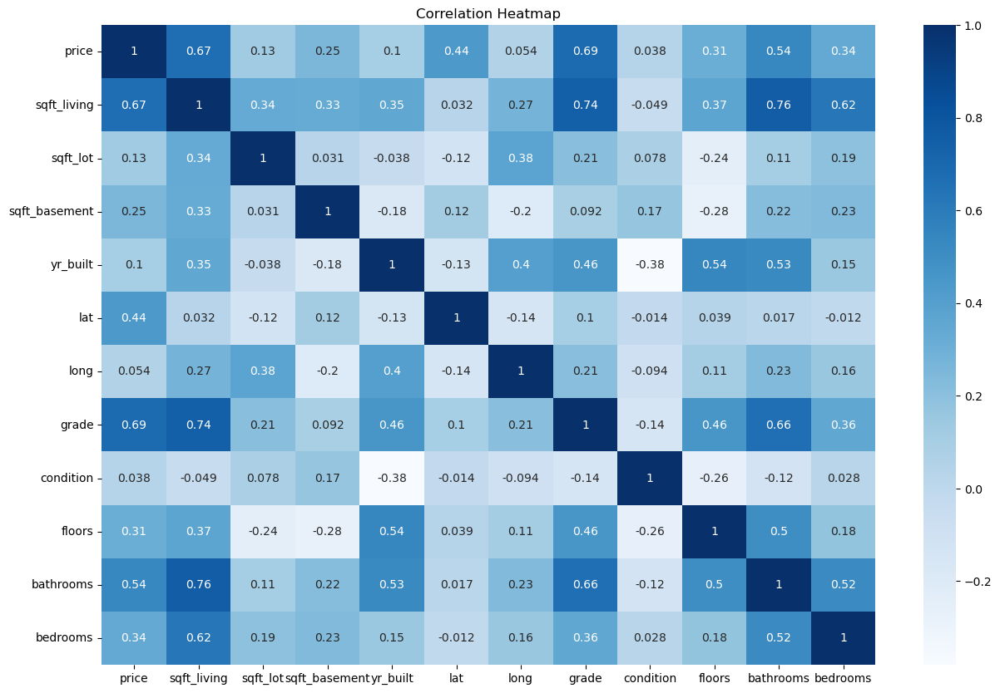

In [25]:
correlation_matrix = transformed_df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues')
plt.title('Correlation Heatmap')
plt.show()

## Model for prediction

ANN

In [41]:
target = 'price'
X = transformed_df.drop(columns=[target])
y = transformed_df[target]

In [42]:
X_train , X_test , y_train , y_test = train_test_split(X ,y ,test_size=0.25 , random_state=42 )
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (16209, 11)
y_train shape: (16209,)
X_test shape: (5404, 11)
y_test shape: (5404,)


In [43]:
model = Sequential()

model.add(Dense(64,activation = 'relu',input_dim=11))
model.add(Dense(64,activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam',loss = "mean_squared_error")
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                      │ (None, 64)                  │             768 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,993 (19.50 KB)

 Trainable params: 4,993 (19.50 KB)

 Non-trainable params: 0 (0.00 B)

In [44]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

In [35]:
transformed_df.drop(["date"],axis=1, inplace = True)


In [36]:
transformed_df.shape


(21613, 12)

In [45]:
history = model.fit(X_train, y_train, epochs=40, batch_size=16, validation_split=0.2, callbacks=[early_stopping])

Epoch 1/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.7576 - val_loss: 0.1792
Epoch 2/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1854 - val_loss: 0.1523
Epoch 3/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1660 - val_loss: 0.1413
Epoch 4/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1574 - val_loss: 0.1370
Epoch 5/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1422 - val_loss: 0.1333
Epoch 6/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1415 - val_loss: 0.1303
Epoch 7/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1410 - val_loss: 0.1276
Epoch 8/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1366 - val_loss: 0.1285
Epoch 9/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1324 - val_loss: 0.1281
Epoch 10/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1300 - val_loss: 0.1270
Epoch 11/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1368 - val_loss: 0.1310
Epoch 12/40
811/811 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step

In [53]:
from sklearn.metrics import  r2_score ,mean_squared_error
ann_train_mean=mean_squared_error(y_train, model.predict(X_train))*100
ann_test_mean=mean_squared_error(y_test, model.predict(X_test))*100

print(f'mean_squared_error score for train: {ann_train_mean}')
print(f'mean_squared_error score for test : {ann_test_mean}')

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
mean_squared_error score for train: 11.618381131003193
mean_squared_error score for test : 12.585150325886751


In [47]:
model.evaluate(X_test,y_test)

169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1312


0.12585152685642242

In [51]:
predictions = model.predict(X_test)

169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [54]:
np.sqrt(mean_squared_error(y_test,predictions))


0.35475555423258354

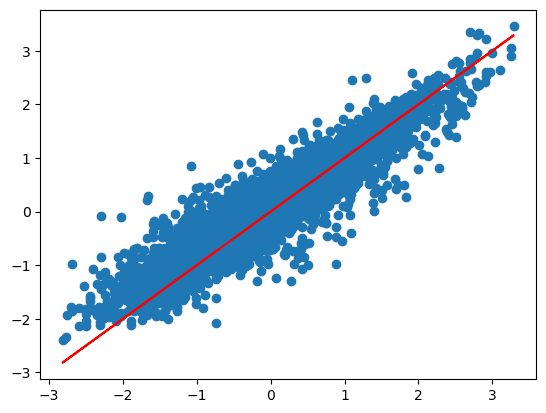

In [56]:
# my predictions
plt.scatter(y_test,predictions)
# perfect predictions
plt.plot(y_test,y_test,'r')
